<a href="https://colab.research.google.com/github/maruf9911/Deep_Learning/blob/main/Dog_vs_Cat_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# installing the Kaggle library
!pip install kaggle

In [4]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
# Kaggle API
#importing Dog vs Cat dataset

!kaggle competitions download -c dogs-vs-cats

 99% 800M/812M [00:04<00:00, 119MB/s]
100% 812M/812M [00:04<00:00, 196MB/s]


In [6]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [7]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/dogs-vs-cats.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [8]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [9]:
import os
# counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print("Number of images: ", file_count)

Number of images:  25000


In [10]:
# Print the name of images

file_names = os.listdir('/content/train')
print(file_names)

['dog.4734.jpg', 'cat.8576.jpg', 'cat.1379.jpg', 'dog.11067.jpg', 'cat.537.jpg', 'cat.12026.jpg', 'dog.4228.jpg', 'dog.7744.jpg', 'cat.269.jpg', 'cat.5099.jpg', 'cat.3785.jpg', 'dog.1981.jpg', 'dog.1347.jpg', 'dog.8178.jpg', 'cat.9586.jpg', 'cat.11330.jpg', 'cat.6904.jpg', 'cat.12138.jpg', 'cat.8281.jpg', 'dog.8158.jpg', 'cat.9829.jpg', 'dog.8618.jpg', 'cat.11237.jpg', 'cat.11286.jpg', 'dog.3643.jpg', 'dog.803.jpg', 'dog.6408.jpg', 'dog.9044.jpg', 'dog.7582.jpg', 'cat.2151.jpg', 'dog.1643.jpg', 'cat.9631.jpg', 'dog.9825.jpg', 'dog.6350.jpg', 'dog.2936.jpg', 'cat.5398.jpg', 'cat.6530.jpg', 'cat.2594.jpg', 'cat.4992.jpg', 'cat.9689.jpg', 'cat.6127.jpg', 'cat.11848.jpg', 'dog.9194.jpg', 'dog.10853.jpg', 'cat.2953.jpg', 'cat.7603.jpg', 'dog.10169.jpg', 'cat.6980.jpg', 'dog.3400.jpg', 'cat.2201.jpg', 'dog.9480.jpg', 'cat.665.jpg', 'dog.5345.jpg', 'cat.9205.jpg', 'dog.10936.jpg', 'cat.8675.jpg', 'dog.5119.jpg', 'dog.8217.jpg', 'dog.5827.jpg', 'dog.5180.jpg', 'cat.9294.jpg', 'dog.9739.jpg', '

In [11]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mping
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the images of dogs and cats

<function matplotlib.pyplot.show(close=None, block=None)>

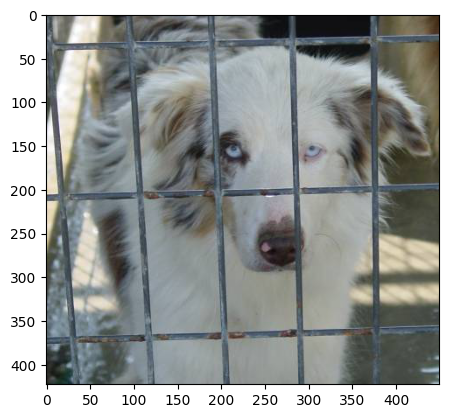

In [12]:
# displaying the image of dog

img = mping.imread('/content/train/dog.4228.jpg')
imgplt = plt.imshow(img)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

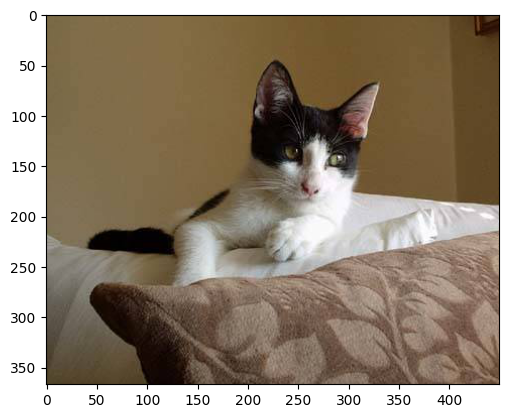

In [13]:
# displaying the image of cat

img = mping.imread('/content/train/cat.537.jpg')
imgplt = plt.imshow(img)
plt.show

In [14]:
file_names = os.listdir("/content/train")

for i in range(5):
  name = file_names[i]

  print(name[0:3])

dog
cat
cat
dog
cat


In [15]:
file_names = os.listdir("/content/train")

dog_count = 0
cat_count = 0

for img_file in file_names:

  name = img_file[0:3]

  if name == 'dog':
    dog_count += 1

  else:
    cat_count += 1


print("Number of dog images: ", dog_count)
print("Number of cat images: ", cat_count)



Number of dog images:  12500
Number of cat images:  12500


**Resizing all the images**

In [16]:
# creating a directory for resized images

os.mkdir('/content/image resized')

In [17]:
original_folder = '/content/train/'
resized_folder = '/content/image resized/'

for i in range(2000):

  filename = os.listdir(original_folder)[i]
  img_path = original_folder+filename

  img = Image.open(img_path)
  img = img.resize((224,224))
  img = img.convert('RGB')

  newImgPath = resized_folder+filename
  img.save(newImgPath)

<function matplotlib.pyplot.show(close=None, block=None)>

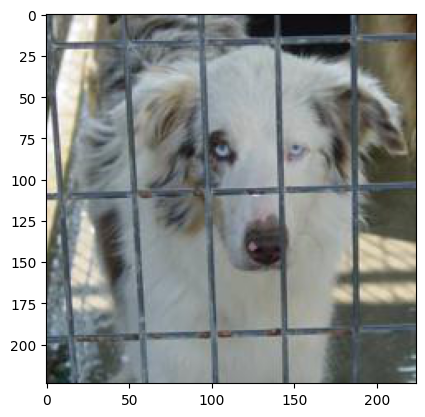

In [18]:
# displaying the image of dog

img = mping.imread('/content/image resized/dog.4228.jpg')
imgplt = plt.imshow(img)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

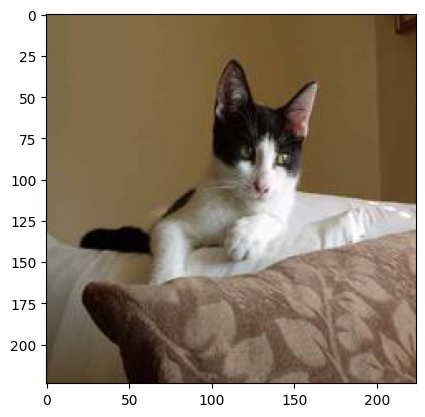

In [19]:
# displaying resized image of cat

img = mping.imread('/content/image resized/cat.537.jpg')
imgplt = plt.imshow(img)
plt.show

In [20]:
# creating a for loop to assign labels

filenames = os.listdir('/content/image resized/')


labels = []

for i in range(2000):
  file_name = filenames[i]
  label = file_name[0:3]

  if label == 'dog':
    labels.append(1)

  else:
    labels.append(0)

In [21]:
print(filenames[0:5])
print(len(filenames))

['dog.4734.jpg', 'cat.8576.jpg', 'cat.1379.jpg', 'dog.11067.jpg', 'cat.537.jpg']
2000


In [22]:
# checking the labels were assigned or not
print(labels[0:5])
print(len(labels))

[1, 0, 0, 1, 0]
2000


In [23]:
# counting the images of dogs and cats out of 2000 images
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[1013  987]


**Converting all the resized images to the numpy arrays**

In [24]:
import cv2
import glob

In [25]:
image_directory = '/content/image resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [26]:
print(dog_cat_images)

[[[[246 251 252]
   [249 254 255]
   [251 255 255]
   ...
   [254 254 254]
   [255 255 255]
   [255 255 255]]

  [[248 253 254]
   [250 255 255]
   [251 255 255]
   ...
   [253 253 253]
   [254 254 254]
   [254 254 254]]

  [[249 254 255]
   [249 254 255]
   [251 255 255]
   ...
   [253 253 253]
   [252 252 252]
   [252 252 252]]

  ...

  [[ 21  32  40]
   [ 19  30  38]
   [ 16  27  35]
   ...
   [ 75 120 123]
   [ 69 114 117]
   [ 61 106 109]]

  [[ 15  26  34]
   [ 14  25  33]
   [ 11  22  30]
   ...
   [ 49  97  98]
   [ 66 114 115]
   [ 79 127 128]]

  [[ 10  21  29]
   [  8  19  27]
   [  6  17  25]
   ...
   [ 19  69  69]
   [ 14  64  64]
   [  1  51  51]]]


 [[[103  91  73]
   [102  90  72]
   [100  88  70]
   ...
   [ 32  63  78]
   [ 36  67  82]
   [ 48  79  94]]

  [[100  88  70]
   [100  88  70]
   [100  88  70]
   ...
   [ 43  74  89]
   [ 44  75  90]
   [ 38  69  84]]

  [[ 95  83  65]
   [ 98  86  68]
   [101  89  71]
   ...
   [ 43  74  89]
   [ 42  73  88]
   [ 34  65

In [27]:
type(dog_cat_images)

numpy.ndarray

In [28]:
dog_cat_images.shape

(2000, 224, 224, 3)

In [29]:
X = dog_cat_images
Y = np.asarray(labels)

**Train Test Split**

In [30]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [31]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 --> training images

400 --> test image

In [32]:
# scaling the data

X_train_scaled = X_train/255

X_test_scaled = X_test/255

In [33]:
X_train_scaled

array([[[[0.41960784, 0.52941176, 0.78039216],
         [0.43529412, 0.54509804, 0.79607843],
         [0.44705882, 0.55686275, 0.81176471],
         ...,
         [0.23137255, 0.25882353, 0.3254902 ],
         [0.22745098, 0.25490196, 0.32156863],
         [0.22745098, 0.25490196, 0.32156863]],

        [[0.42352941, 0.53333333, 0.78431373],
         [0.43529412, 0.54509804, 0.79607843],
         [0.44705882, 0.55686275, 0.81176471],
         ...,
         [0.23137255, 0.25882353, 0.3254902 ],
         [0.22745098, 0.25490196, 0.32156863],
         [0.22745098, 0.25490196, 0.32156863]],

        [[0.43137255, 0.5372549 , 0.78823529],
         [0.44313725, 0.54901961, 0.8       ],
         [0.45098039, 0.56078431, 0.81568627],
         ...,
         [0.23137255, 0.25882353, 0.3254902 ],
         [0.22745098, 0.25490196, 0.32156863],
         [0.22352941, 0.25098039, 0.31764706]],

        ...,

        [[0.75294118, 0.78039216, 0.76078431],
         [0.70588235, 0.73333333, 0.71372549]

**Building the neural network**

In [34]:
import tensorflow as tf
import tensorflow_hub as hub

In [35]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

In [37]:
num_of_classes = 2

model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [39]:
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['acc']
)

In [40]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 15s 39ms/step - loss: 0.2254 - acc: 0.9044
Epoch 2/5
50/50 [==============================] - 2s 39ms/step - loss: 0.0727 - acc: 0.9750
Epoch 3/5
50/50 [==============================] - 2s 39ms/step - loss: 0.0549 - acc: 0.9831
Epoch 4/5
50/50 [==============================] - 2s 42ms/step - loss: 0.0447 - acc: 0.9862
Epoch 5/5
50/50 [==============================] - 2s 40ms/step - loss: 0.0365 - acc: 0.9906


In [42]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print("Test loss = ", score)
print("Test Accuracy  = ", acc)

13/13 [==============================] - 1s 43ms/step - loss: 0.0452 - acc: 0.9850
Test loss =  0.04521586000919342
Test Accuracy  =  0.9850000143051147


Path of the image to be predicted: /content/beagle-hound-dog.webp


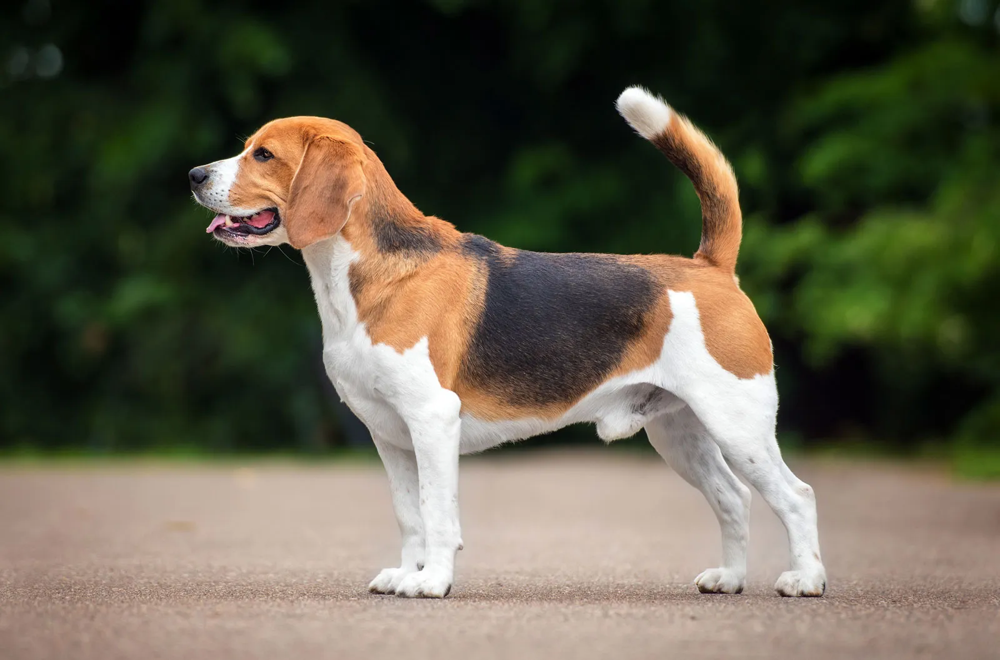

1/1 [==============================] - 1s 1s/step
[[-3.3321276  3.6774147]]
1
The image represents a Dog


In [43]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/licensed-image.jpeg


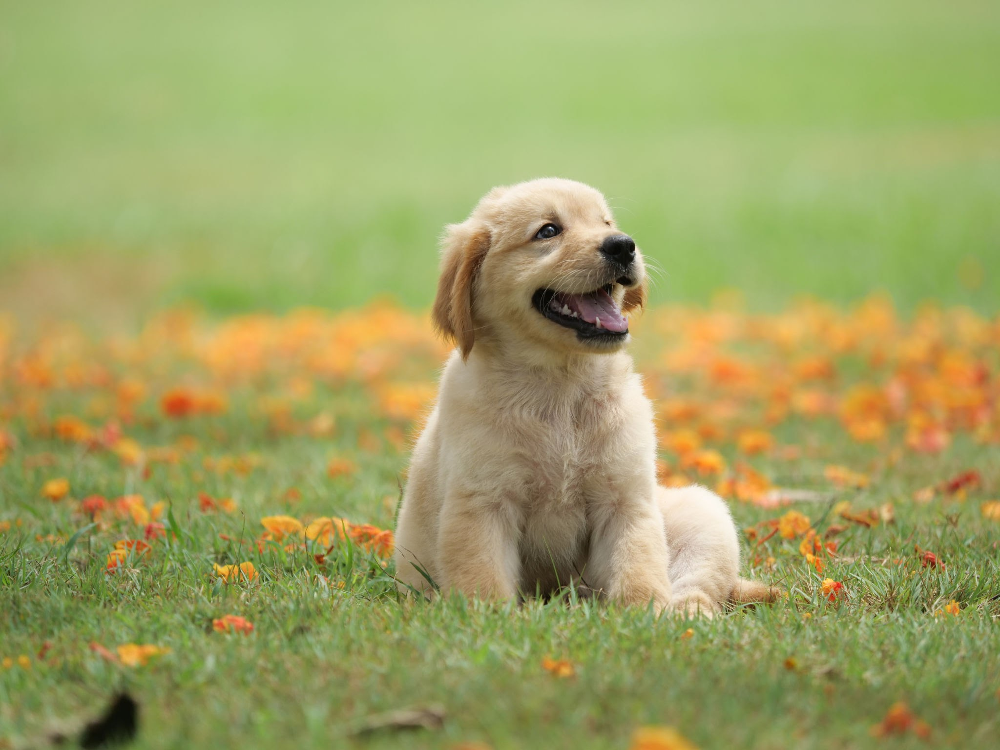

1/1 [==============================] - 0s 39ms/step
[[-3.247058  3.478888]]
1
The image represents a Dog


In [44]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/beautiful-smooth-haired-red-cat-lies-on-the-sofa-royalty-free-image-1678488026.jpg


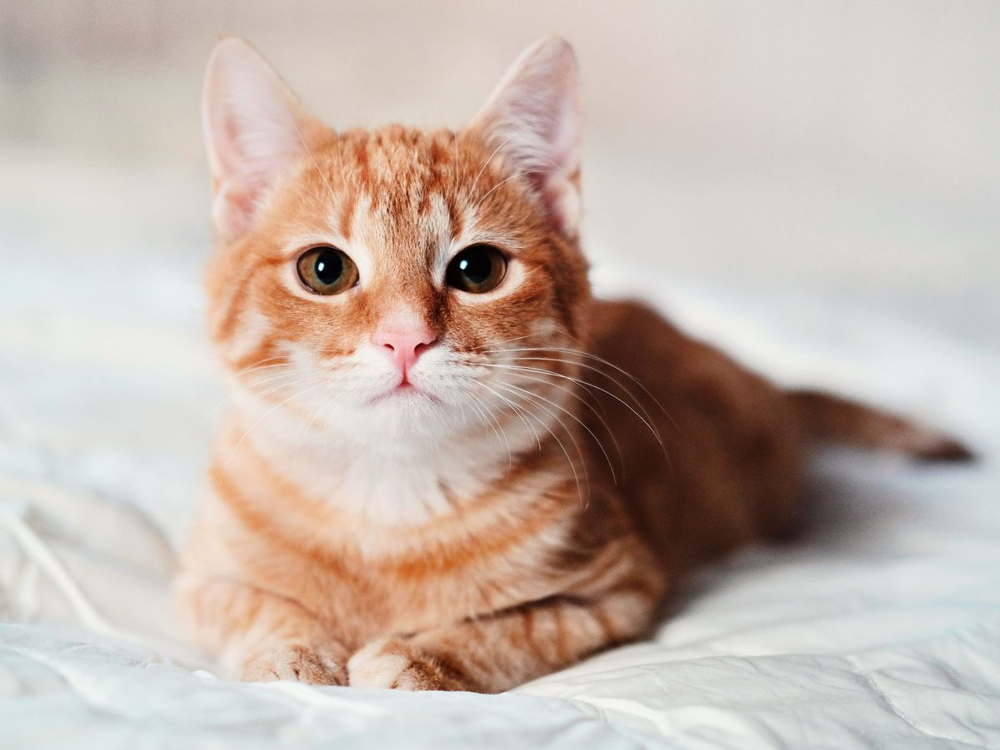

1/1 [==============================] - 0s 31ms/step
[[ 5.104016 -4.745286]]
0
The image represents a Cat


In [45]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/licensed-image (1).jpeg


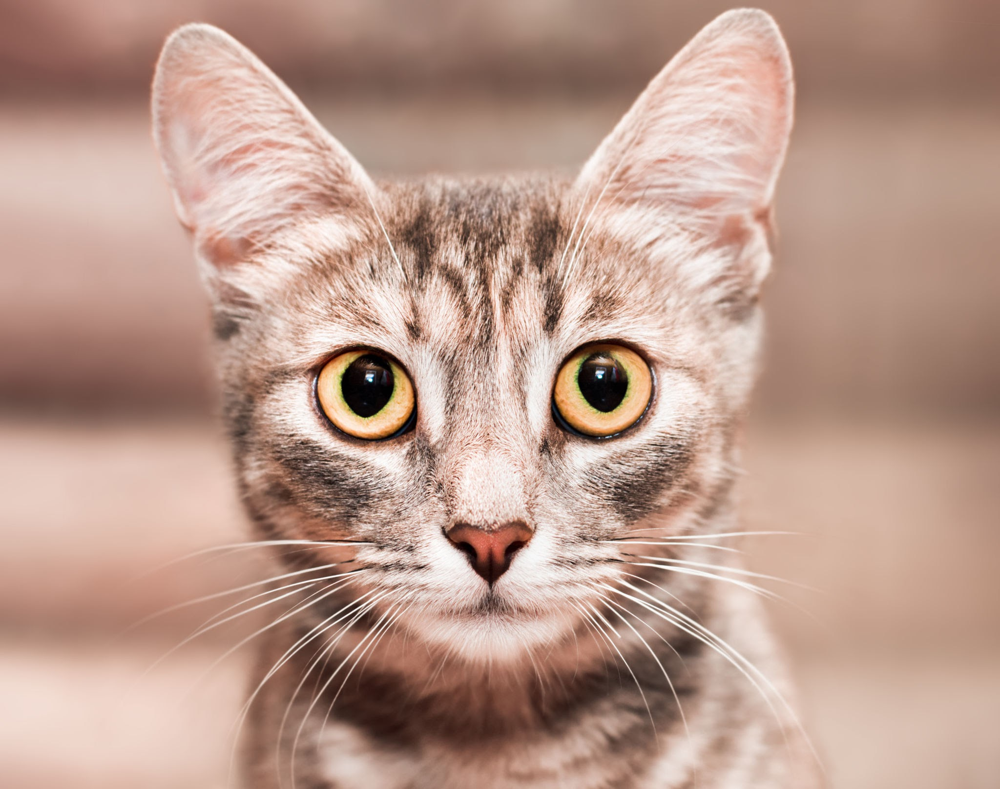

1/1 [==============================] - 0s 36ms/step
[[ 3.378887  -2.7999785]]
0
The image represents a Cat


In [46]:
input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')